# Setup environment

In [1]:
import pymc as pm
import arviz as az
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from numpy.random import MT19937
from numpy.random import RandomState, SeedSequence

from bargaining_utility_functions import synthetic_data, import_bayaka, import_agta

# BaYaka

In [2]:
bayaka_data = import_bayaka()

bayaka_leisure_ratio = bayaka_data.leisureratio.values
bayaka_average_age = (bayaka_data.agem.values + bayaka_data.agefem.values) / 2
bayaka_age_difference = bayaka_data.agem.values - bayaka_data.agefem.values
bayaka_dependants = bayaka_data.dependants.values

# find stick differences

stick_difference = bayaka_data.male_relational.values - bayaka_data.female_relational.values
bayaka_data['stick_difference'] = stick_difference
bayaka_data['difference_in_z_score'] = bayaka_data.male_z_relational - bayaka_data.female_z_relational

bayaka_data

,ID,agem,agefem,camp,male_relational,female_relational,leisurem_counts,leisuref_counts,budget,leisureratio,dependants,male_z_relational,female_z_relational,stick_difference,difference_in_z_score
0,CML00201M060,26.25,29.37,0,1,4,30,21,51,0.534682,1,-0.880409,0.146735,-3,-1.027144
1,CML00403M097,21.48,19.41,0,2,0,4,3,7,0.571429,1,-0.538028,-1.222790,2,0.684762
2,CML00405M100,62.86,50.63,0,1,0,15,10,25,0.600000,3,-0.880409,-1.222790,1,0.342381
3,CML00906M239,45.58,35.35,0,8,4,26,12,38,0.635403,5,1.516260,0.146735,4,1.369525
4,CML00110M036,66.28,47.25,0,4,1,8,7,15,0.533333,5,0.146735,-0.880409,3,1.027144
5,CML00114M044,26.67,24.35,0,9,5,42,28,70,0.546798,1,1.858641,0.489116,4,1.369525
6,CML00117M056,38.05,35.73,0,8,3,29,14,43,0.610526,4,1.516260,-0.195646,5,1.711906
7,CMA01702M653,60.11,50.84,1,8,3,13,18,31,0.419355,1,2.295170,0.160128,5,2.135042
8,CML01202M213,42.22,40.00,1,1,2,27,44,71,0.398722,4,-0.693889,-0.266880,-1,-0.427008
9,CMA01704M661,28.66,20.00,1,7,0,24,26,50,0.480000,1,1.868162,-1.120897,7,2.989059


In [3]:
bayaka_data.difference_in_z_score.values.mean(), bayaka_data.difference_in_z_score.values.std() 

(0.5934009062808842, 1.1462765573069242)

In [12]:
np.mean(bayaka_data.leisurem_counts.values / bayaka_data.budget.values), np.std(bayaka_data.leisurem_counts.values / bayaka_data.budget.values)

(0.5552580542090229, 0.14553839262053198)

In [14]:
x = bayaka_data.male_z_relational.values
y = bayaka_data.female_z_relational.values

np.corrcoef(x,y)

array([[1.        , 0.31360764],
       [0.31360764, 1.        ]])

In [6]:
x = bayaka_data.male_z_relational.values
y = bayaka_data.female_z_relational.values

stats.pearsonr(x,y)

PearsonRResult(statistic=0.3136076378502935, pvalue=0.14506302480010375)

## Prior modeling

In [4]:
# differences in z scores version

k = bayaka_data.leisurem_counts.values
n = bayaka_data.budget.values

x1 = bayaka_data.difference_in_z_score.values
x2 = bayaka_average_age
x3 = bayaka_age_difference
x4 = bayaka_dependants
camp = bayaka_data.camp.values

with pm.Model() as m1_bayaka:
    
    # hyper prior
    hb1mu = pm.Normal('group-level relational wealth',0,0.5)
    hb1std = pm.Exponential('group-level variation',1)
    
    # intercept
    a = pm.Normal('intercept',0,2)
    
    # slope
    bz = pm.Normal('bz',hb1mu,1,shape=3)
    b1 = pm.Deterministic('camp-level relational wealth',hb1std*bz)
    b2 = pm.Normal('average age',0.01,0.02)
    b3 = pm.Normal('age difference',0.01,0.03)
    b4 = pm.Normal('dependants',0,0.2)
    
    # regression equation
    p = pm.invlogit(a + b1[camp]*x1 + b2*x2 + b3*x3 + b4*x4)
    p = pm.Deterministic('p',p)
    
    # outcome distribution
    y = pm.Binomial('y',p=p,n=n,observed=k)

### Relational wealth effect prior prediction

We simulated the largest possible effect size we could using synthetic data to determine the upper bound on the logistic regression effect coefficient.

In [9]:
data = synthetic_data(300,3,-0.5,0.4,0.00)
k = data.leisurem_counts.values
n = data.budget.values
x = data.difference_in_z_score.values

with pm.Model() as max_effective_size:
    
    # priors
    
    # intercept
    a = pm.Normal('a',0,5)
    
    # slope
    b = pm.Normal('b',0,5)
    
    # regression equation
    p = pm.invlogit(a + b*x)
    p = pm.Deterministic('p',p)
    
    # outcome distribution
    y = pm.Binomial('y',p=p,n=n,observed=k)
    t_max_effective_size = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 23 seconds.
c:\Users\dsaun\Anaconda3\envs\pymc_env\Lib\site-packages\arviz\utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


1.3351386424398966


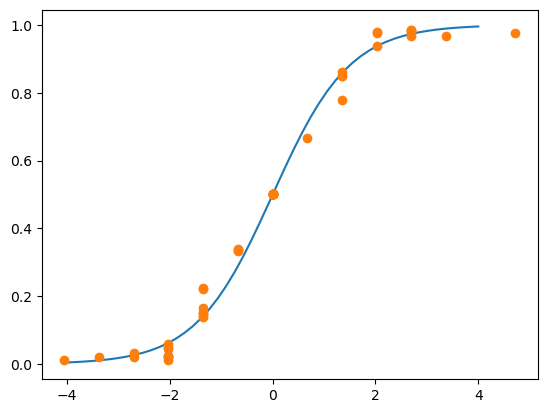

In [10]:
#x = data.male_relational_wealth.values - data.female_relational_wealth.values
x = data.difference_in_z_score.values
y = data.leisurem_counts.values / data.budget.values

a = t_max_effective_size.posterior['a'].mean(('chain','draw')).values
b = t_max_effective_size.posterior['b'].mean(('chain','draw')).values
xs = np.linspace(-4,4,50)
ys = np.exp(a + b*xs) / (1 + np.exp(a + b*xs))

plt.plot(xs,ys)
plt.plot(x,y,'o')
print(b)

### Camp effect prior prediction

Visualize what the relational wealth effect might look like across all three camps. This code samples from the multi-level prior structure.

Sampling: [age difference, average age, bz, dependants, group-level relational wealth, group-level variation, intercept, y]


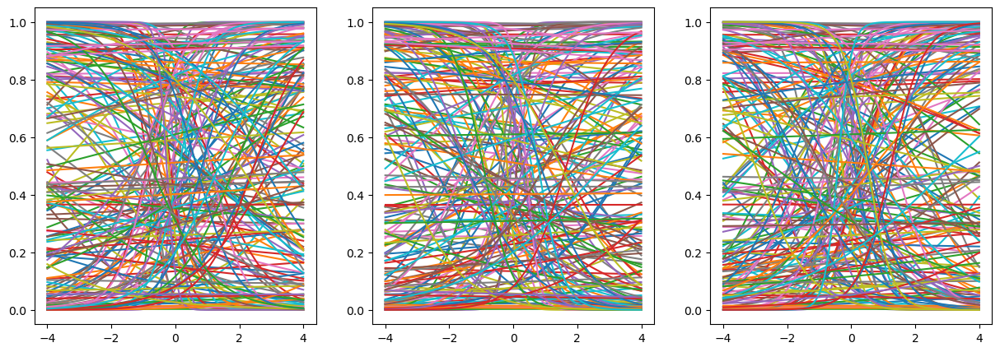

In [21]:
num_samples = 200

with m1_bayaka:
    pp1 = pm.sample_prior_predictive(num_samples)

x = np.linspace(-4,4,100)

f,ax = plt.subplots(1,3,figsize=(15,5))

for i in range(num_samples):

    a = pp1.prior['intercept'][0][i].values
    b_0 = pp1.prior['camp-level relational wealth'][0][i,0].values
    b_1 = pp1.prior['camp-level relational wealth'][0][i,1].values
    b_2 = pp1.prior['camp-level relational wealth'][0][i,2].values
    
    #print(b_0)
    
    y_0 = np.exp(a + b_0 * x) / (1 + np.exp(a + b_0 * x))
    y_1 = np.exp(a + b_1 * x) / (1 + np.exp(a + b_1 * x))
    y_2 = np.exp(a + b_2 * x) / (1 + np.exp(a + b_2 * x))
    
    ax[0].plot(x,y_0)
    ax[1].plot(x,y_1)
    ax[2].plot(x,y_2)

### Age effects prior prediction

Visualize what the age effects look like individually. Differences first.

(0.0, 1.0)

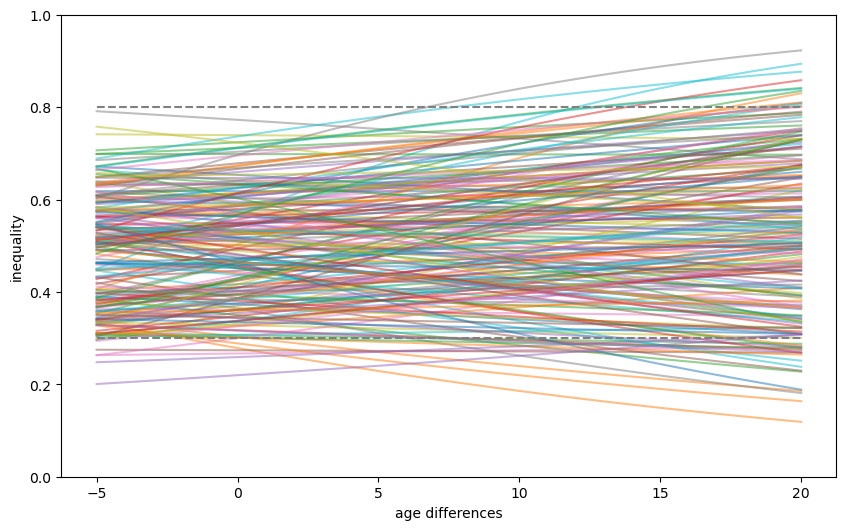

In [15]:
x = np.linspace(-5,20,100)

for i in range(200):

    a = stats.norm(0,0.5).rvs()
    b = stats.norm(0.01,0.03).rvs()

    y = b * x + a
    y = np.exp(y) / (1 + np.exp(y))

    plt.plot(x,y,alpha=0.5)
    
#plt.plot(x,[0.5]*100,'--',color='grey')
plt.plot(x,[0.8]*100,'--',color='grey')
plt.plot(x,[0.3]*100,'--',color='grey')
plt.ylabel('inequality')
plt.xlabel('age differences')
plt.ylim([0,1])

Then average age.

(0.0, 1.0)

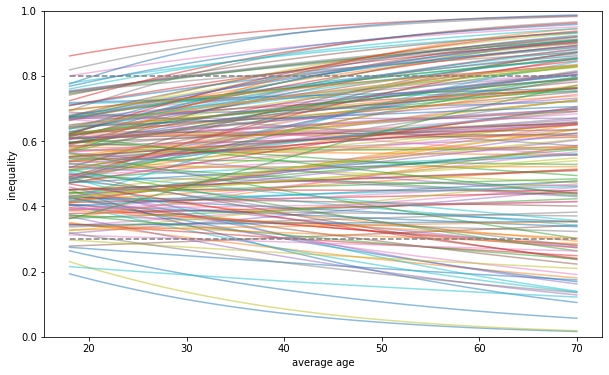

In [416]:
# coefficient scale when x is [18-100]

x = np.linspace(18,70,100)

for i in range(200):

    a = stats.norm(0,0.5).rvs()
    b = stats.norm(0.01,0.02).rvs()

    y = b * x + a
    y = np.exp(y) / (1 + np.exp(y))

    plt.plot(x,y,alpha=0.5)
    
#plt.plot(x,[0.5]*100,'--',color='grey')
plt.plot(x,[0.8]*100,'--',color='grey')
plt.plot(x,[0.3]*100,'--',color='grey')
plt.ylabel('inequality')
plt.xlabel('average age')
plt.ylim([0,1])

### Dependents

(0.0, 1.0)

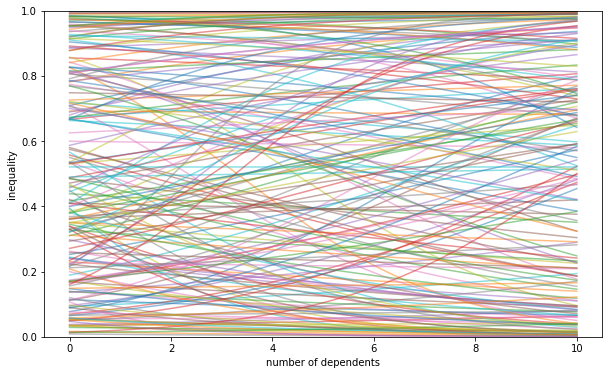

In [81]:
x = np.linspace(0,10,100)

for i in range(200):

    a = stats.norm(0,2).rvs()
    b = stats.norm(0,0.2).rvs()

    y = b * x + a
    y = np.exp(y) / (1 + np.exp(y))

    plt.plot(x,y,alpha=0.5)
    
plt.ylabel('inequality')
plt.xlabel('number of dependents')
plt.ylim([0,1])

### Composite prediction

Visualize the effect of all our priors interacting simultaneously.

Sampling: [age difference, average age, bz, dependants, group-level relational wealth, group-level variation, intercept, y]


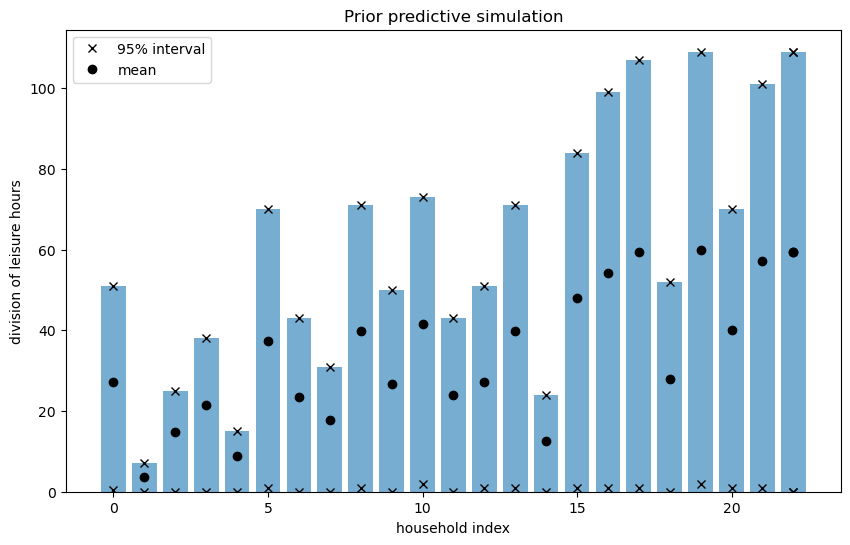

In [22]:
num_samples = 500

with m1_bayaka:
    pp1 = pm.sample_prior_predictive(num_samples)
    
x = np.arange(23)

plt.bar(x,n,alpha=0.6)

for i in range(23):
    top = np.percentile(pp1.prior_predictive['y'][0][:,i],97.5)
    bottom = np.percentile(pp1.prior_predictive['y'][0][:,i],2.5)
    mean = pp1.prior_predictive['y'][0][:,i].mean().values
    plt.plot(i,top,'x',color="black")
    plt.plot(i,bottom,'x',color="black")
    plt.plot(i,mean,'o',color="black")
    
plt.plot(i,top,'x',color="black")
plt.plot(i,bottom,'x',color="black",label="95% interval")
plt.plot(i,mean,'o',color="black",label="mean")
    
plt.title('Prior predictive simulation')
plt.xlabel('household index')
plt.ylabel('division of leisure hours')
plt.legend()

## Sampling

In [6]:
rs = RandomState(MT19937(SeedSequence(123456789)))

with m1_bayaka:
    t1 = pm.sample(tune=2000,draws=2000,target_accept=0.9,chains=4,random_seed=rs)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group-level relational wealth, group-level variation, intercept, bz, average age, age difference, dependants]


Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 47 seconds.


In [7]:
t1.to_json('trace_bayaka')

'trace_bayaka'

In [5]:
t1 = az.from_json('trace_bayaka')

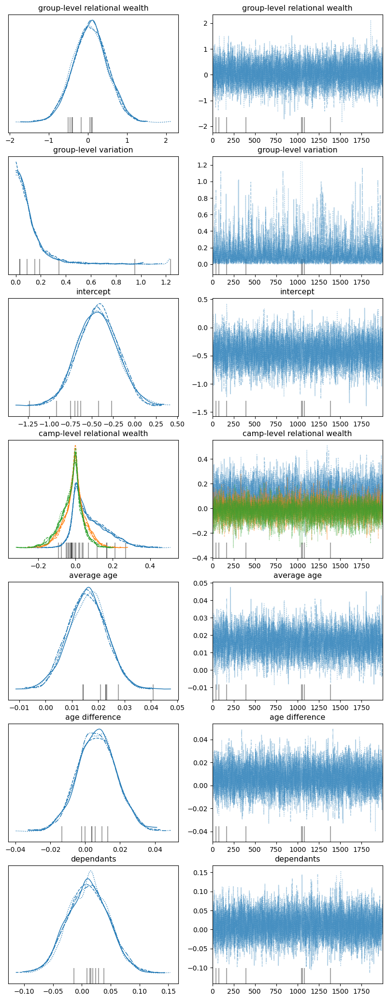

In [9]:
var_names=['group-level relational wealth','group-level variation',"intercept",'camp-level relational wealth','average age','age difference','dependants']

az.plot_trace(t1,var_names=var_names,figsize=(10,26));

In [10]:
var_names=['group-level relational wealth','group-level variation',"intercept",'camp-level relational wealth','average age','age difference','dependants']

az.summary(t1,var_names=var_names,hdi_prob=0.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
group-level relational wealth,0.057,0.441,-0.830,0.883,0.006,0.005,5395.0,5535.0,1.0
group-level variation,0.117,0.138,0.000,0.344,0.004,0.004,1886.0,2979.0,1.0
intercept,-0.435,0.232,-0.869,0.029,0.004,0.003,3716.0,4297.0,1.0
camp-level relational wealth[0],0.077,0.091,-0.058,0.271,0.002,0.001,3163.0,6377.0,1.0
camp-level relational wealth[1],-0.005,0.059,-0.131,0.115,0.001,0.001,7655.0,7118.0,1.0
camp-level relational wealth[2],-0.024,0.059,-0.155,0.089,0.001,0.001,5216.0,6601.0,1.0
average age,0.016,0.007,0.002,0.030,0.000,0.000,3676.0,3938.0,1.0
age difference,0.007,0.011,-0.015,0.029,0.000,0.000,6495.0,5776.0,1.0
dependants,0.011,0.035,-0.059,0.077,0.000,0.000,5932.0,5263.0,1.0


## Results

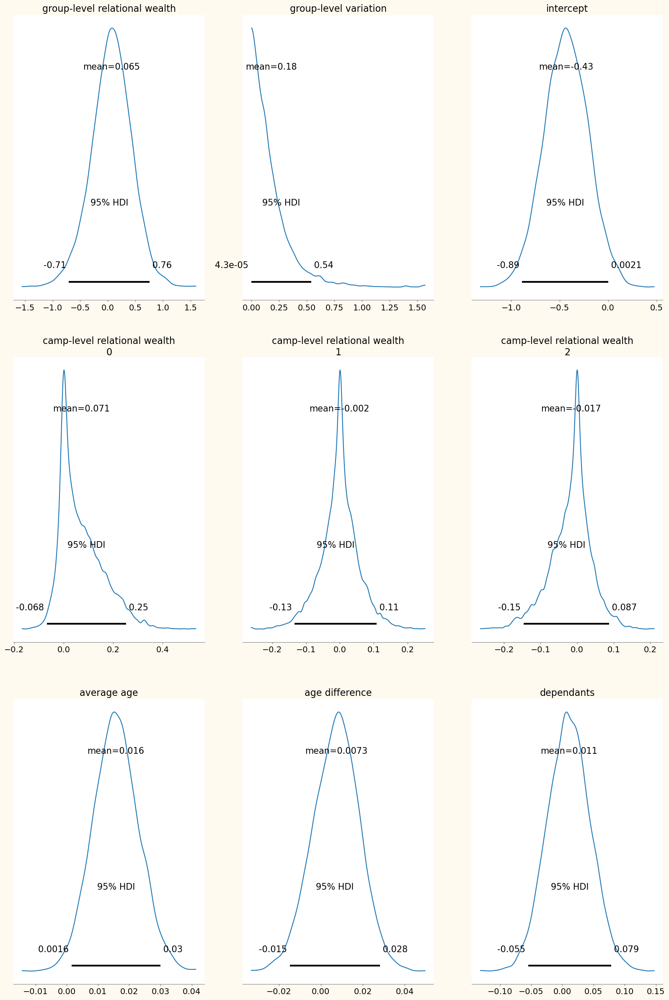

In [27]:
var_names=['group-level relational wealth','group-level variation',"intercept",'camp-level relational wealth','average age','age difference','dependants']

az.plot_posterior(t1,var_names=var_names,hdi_prob=0.95,figsize=(20,30),backend_kwargs={'facecolor':"floralwhite"});

## Posterior Checks

A range of visualizations to help us interpret the posterior distribution.

### Composite effect

Visualize what overall posterior for all parameters says about the outcome variable. One way to get a sense for how much the model learned about the data is to compare this plot to the composite predictions.

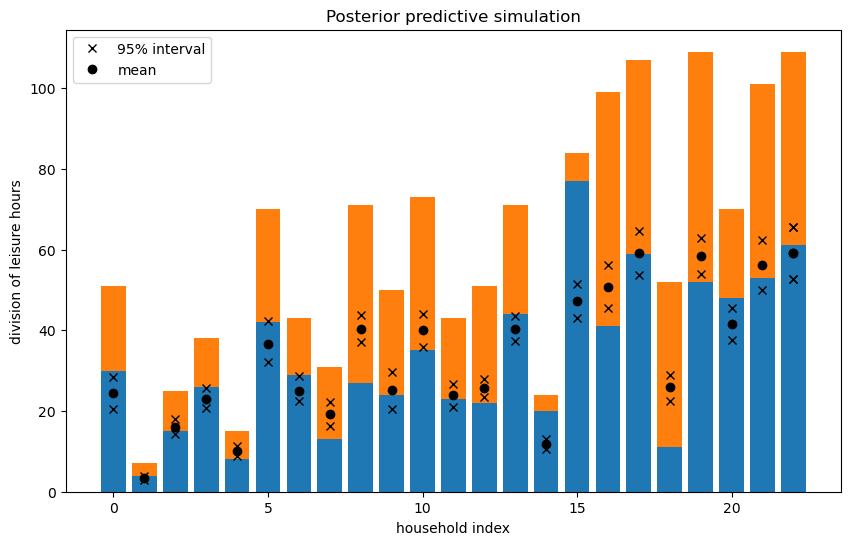

In [28]:
x = np.arange(len(bayaka_data))
n = bayaka_data.budget.values
k = bayaka_data.leisurem_counts.values

plt.bar(x,k)
plt.bar(x,n-k,bottom=k)

for i in range(len(bayaka_data)):
    top = n[i]* np.percentile(t1.posterior['p'][:,:,i],97.5)
    bottom = n[i]*np.percentile(t1.posterior['p'][:,:,i],2.5)
    mean = n[i]*t1.posterior['p'][:,:,i].mean().values
    plt.plot(i,top,'x',color="black")
    plt.plot(i,bottom,'x',color="black")
    plt.plot(i,mean,'o',color="black")
    
plt.plot(i,top,'x',color="black")
plt.plot(i,bottom,'x',color="black",label="95% interval")
plt.plot(i,mean,'o',color="black",label="mean")
    
plt.title('Posterior predictive simulation')
plt.xlabel('household index')
plt.ylabel('division of leisure hours')
plt.legend()

(0.0, 1.0)

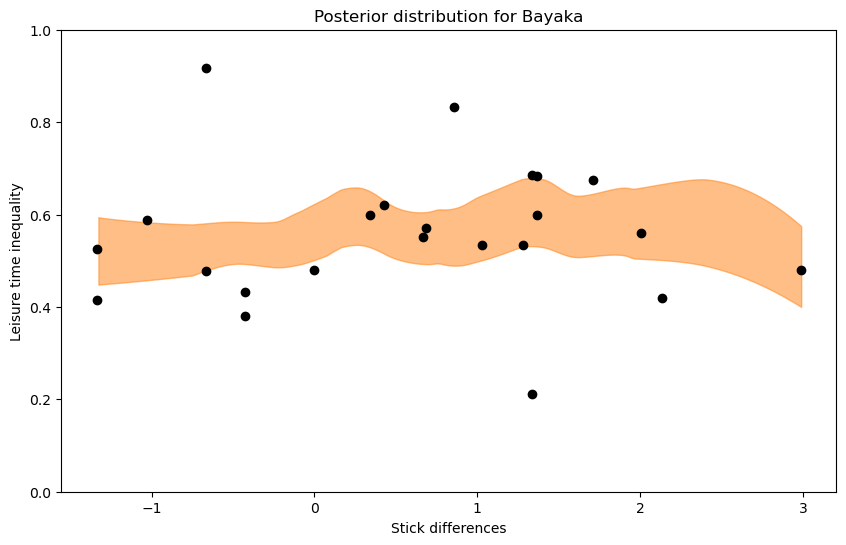

In [6]:
#x = bayaka_data.stick_difference.values
x = bayaka_data.difference_in_z_score.values
k = bayaka_data.leisurem_counts.values
n = bayaka_data.budget.values

az.plot_hdi(x,t1.posterior['p'],hdi_prob=0.95)
plt.plot(x,k/n,'o',color='black',label='observed')
plt.title('Posterior distribution for Bayaka')
plt.xlabel('Stick differences')
plt.ylabel('Leisure time inequality')
plt.ylim([0,1])

Sampling: [y]


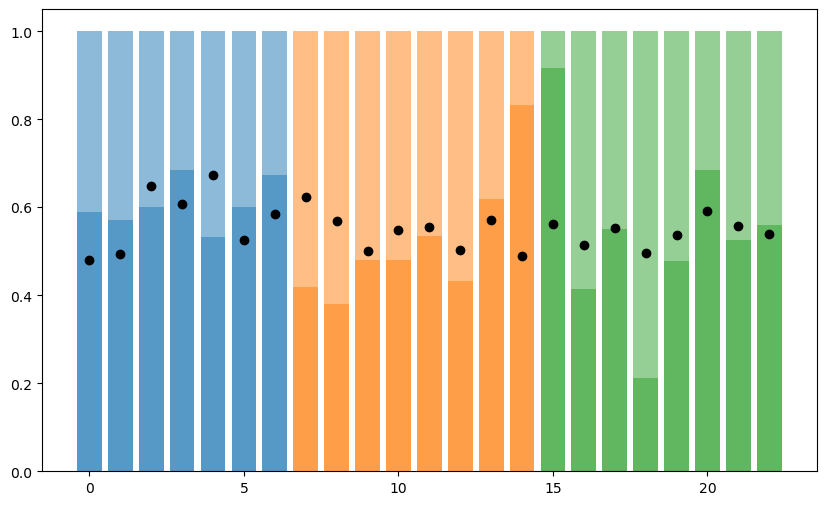

In [34]:
post_pred_bayaka = pm.sample_posterior_predictive(t1,model=m1_bayaka)

pred_samples = post_pred_bayaka.posterior_predictive['y'].values.reshape((8000,23))

x = np.arange(23)

camp_colors = ['tab:blue','tab:orange','tab:green']
ceiling = np.ones(23)

for i in range(23):
    top = np.percentile(pred_samples[:,i],97.5)
    bottom = np.percentile(pred_samples[:,i],2.5)
    mean = pred_samples[:,i].mean()
    plt.plot(i,(mean/n)[i],'o',color="black")
    plt.bar(i,(k/n)[i],color=camp_colors[camp[i]],alpha=0.5)
    plt.bar(i,ceiling[i],color=camp_colors[camp[i]],alpha=0.5)

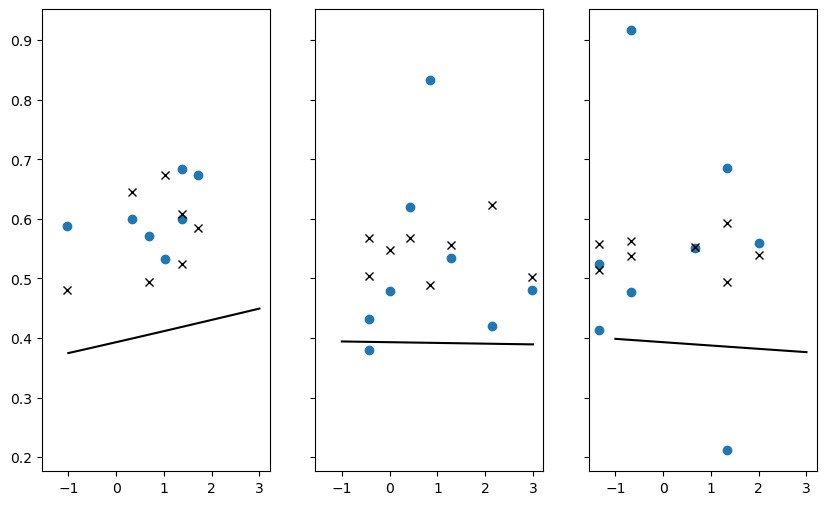

In [58]:
f, ax = plt.subplots(1,3,sharex=True,sharey=True)

pred_samples = post_pred_bayaka.posterior_predictive['y'].values.reshape((8000,23))
pred_k = pred_samples.mean(axis=0)

a = t1.posterior['intercept'].mean(('chain','draw')).values
b = t1.posterior['camp-level relational wealth'].mean(('chain','draw')).values

x = np.linspace(-1,3)

for i in range(3):
    
    y = np.exp(a + b[i]*x) / (1 + np.exp(a + b[i]*x))
    
    ax[i].plot(x,y,color="black")
    ax[i].plot(x1[camp == i],k[camp == i]/n[camp == i],'o')
    ax[i].plot(x1[camp == i],pred_k[camp == i]/n[camp == i],'x',color="black")

### Relational wealth group-level effect

Visualize just the aggregate group-level relational wealth effect.

(-2.5, 3.1)

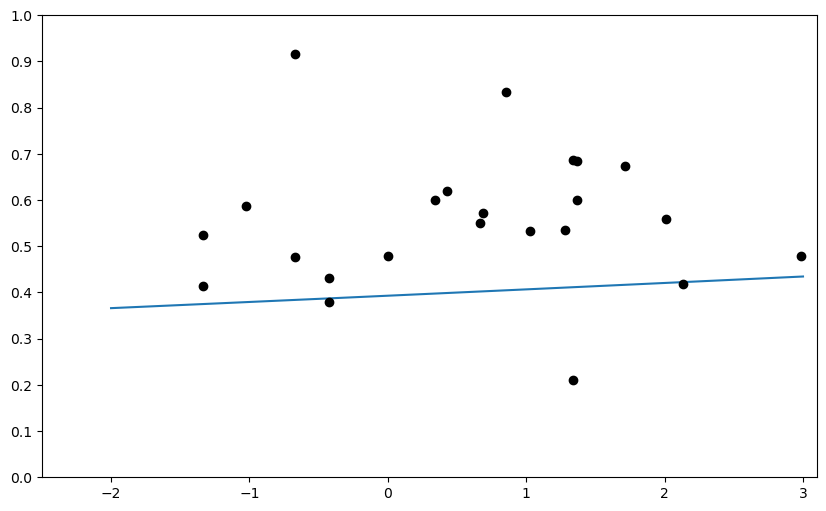

In [33]:
x = np.linspace(-2,3,100)

k = bayaka_data.leisurem_counts.values
n = bayaka_data.budget.values

a = t1.posterior['intercept'].mean(('chain','draw')).values
b = t1.posterior['group-level relational wealth'].mean(('chain','draw')).values

y = np.exp(a + b*x) / (1 + np.exp(a + b*x))

plt.plot(x,y)
plt.plot(bayaka_data.difference_in_z_score.values,k/n,'o',color='black')
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
plt.xticks([-2,-1,0,1,2,3])
plt.ylim([0,1])
plt.xlim([-2.5,3.1])

The next plot depicts uncertainty. I sampled the bottom of the posterior distribution on the group-level effect, the top and the mean and plotted all of them.

C:\Users\dsaun\AppData\Local\Temp\ipykernel_8900\2655010709.py:19: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdis = az.hdi(ys)


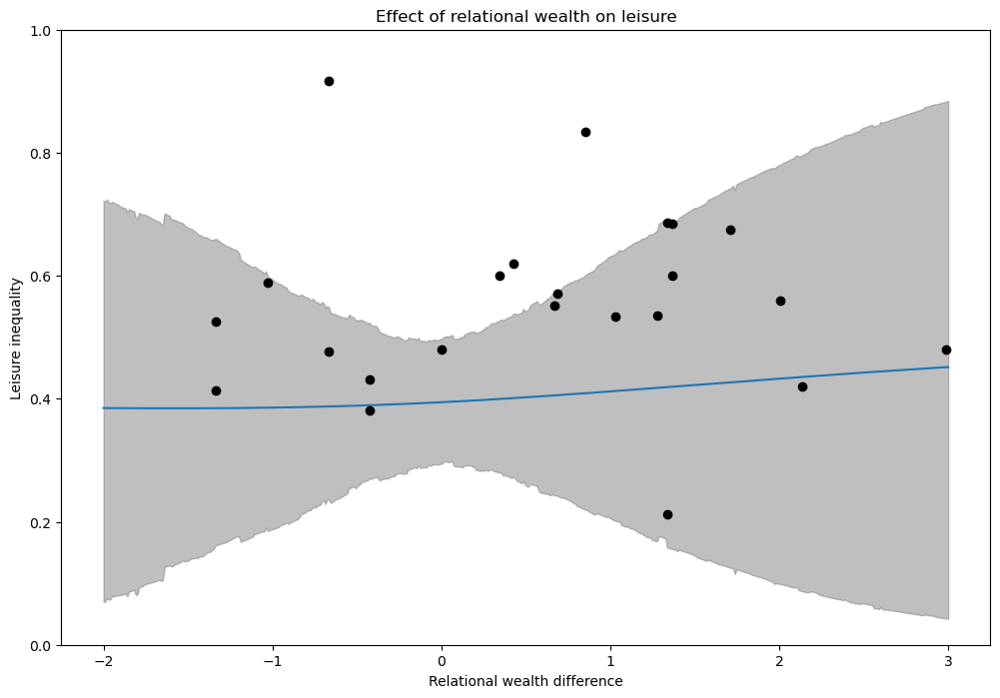

In [19]:
x = np.linspace(-2,3,500)

k = bayaka_data.leisurem_counts.values
n = bayaka_data.budget.values

intercepts = t1.posterior['intercept'].values.flatten()
slopes = t1.posterior['group-level relational wealth'].values.flatten()

ys = []

for i in range(8000):

    a = intercepts[i]
    b = slopes[i]
    y = np.exp(a + b*x) / (1 + np.exp(a + b*x))
    ys.append(y)
    
ys = np.array(ys)
hdis = az.hdi(ys)
y = ys.mean(axis=0) 
y1 = hdis[:,0]
y2 = hdis[:,1]

plt.figure(figsize=(12,8))

plt.plot(x,y)
plt.fill_between(x,y1,y2,color="grey",alpha=0.5)
plt.plot(bayaka_data.difference_in_z_score.values,k/n,'o',color='black',label='observed')
plt.ylim([0,1])
plt.xlabel("Relational wealth difference")
plt.ylabel("Leisure inequality")
plt.title("Effect of relational wealth on leisure");

### Age effects

(0.0, 1.0)

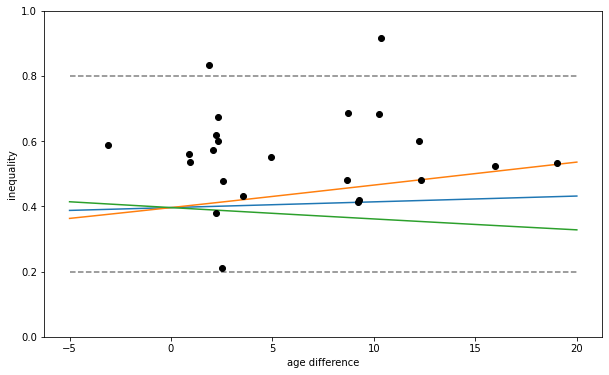

In [426]:
# coefficient scale when x = [-5,20]

x = np.linspace(-5,20,100)
a = t1.posterior['intercept'].mean(('chain','draw')).values
b = t1.posterior['age difference'].mean(('chain','draw')).values
b1 = np.percentile(t1.posterior['age difference'],97.5)
b2 = np.percentile(t1.posterior['age difference'],2.5)

y = b * x + a
y = np.exp(y) / (1 + np.exp(y))
y1 = b1 * x + a
y1 = np.exp(y1) / (1 + np.exp(y1))
y2 = b2 * x + a
y2 = np.exp(y2) / (1 + np.exp(y2))

plt.plot(x,y)
plt.plot(x,y1)
plt.plot(x,y2)
plt.ylabel('inequality')
plt.xlabel('age difference')
plt.plot(x,[0.8]*100,'--',color='grey')
plt.plot(x,[0.2]*100,'--',color='grey')
plt.plot(bayaka_age_difference,k/n,'o',color='black',label='observed')
plt.ylim([0,1])

(0.0, 1.0)

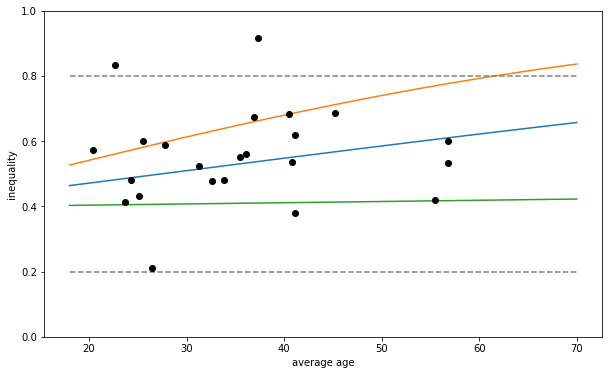

In [427]:
# coefficient scale when x is [18-100]

a = t1.posterior['intercept'].mean(('chain','draw')).values
b = t1.posterior['average age'].mean(('chain','draw')).values
b1 = np.percentile(t1.posterior['average age'],97.5)
b2 = np.percentile(t1.posterior['average age'],2.5)

x = np.linspace(18,70,100)
y = b * x + a
y = np.exp(y) / (1 + np.exp(y))
y1 = b1 * x + a
y1 = np.exp(y1) / (1 + np.exp(y1))
y2 = b2 * x + a
y2 = np.exp(y2) / (1 + np.exp(y2))

plt.plot(x,y)
plt.plot(x,y1)
plt.plot(x,y2)
#plt.plot(x,[0.5]*100,'--',color='grey')
plt.plot(x,[0.8]*100,'--',color='grey')
plt.plot(x,[0.2]*100,'--',color='grey')
plt.ylabel('inequality')
plt.xlabel('average age')
plt.plot(bayaka_average_age,k/n,'o',color='black',label='observed')
plt.ylim([0,1])

## Varying intercept version

In [68]:
# differences in z scores version

k = bayaka_data.leisurem_counts.values
n = bayaka_data.budget.values

x1 = bayaka_data.difference_in_z_score.values
x2 = bayaka_average_age
x3 = bayaka_age_difference
x4 = bayaka_dependants
camp = bayaka_data.camp.values

with pm.Model() as m1_bayaka_multimulti:
    
    # hyper prior
    hb1mu = pm.Normal('group-level relational wealth',0,0.5)
    hb1std = pm.Exponential('group-level variation',1)
    
    hamu = pm.Normal('group-level intercept',0,1)
    bastd = pm.Exponential('bastd',1)
    
    # intercept
    a_z = pm.Normal('az',hamu,1,shape=3)
    a = pm.Deterministic('intercept',az*bastd)
    
    # slope
    bz = pm.Normal('bz',hb1mu,1,shape=3)
    b1 = pm.Deterministic('camp-level relational wealth',hb1std*bz)
    b2 = pm.Normal('average age',0.01,0.02)
    b3 = pm.Normal('age difference',0.01,0.03)
    b4 = pm.Normal('dependants',0,0.2)
    
    # regression equation
    p = pm.invlogit(a[camp] + b1[camp]*x1 + b2*x2 + b3*x3 + b4*x4)
    p = pm.Deterministic('p',p)
    
    # outcome distribution
    y = pm.Binomial('y',p=p,n=n,observed=k)

In [69]:
rs = RandomState(MT19937(SeedSequence(123456789)))

with m1_bayaka_multimulti:
    t1_mm = pm.sample(tune=2000,draws=2000,target_accept=0.9,chains=4,random_seed=rs)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group-level relational wealth, group-level variation, group-level intercept, bastd, az, bz, average age, age difference, dependants]


Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 132 seconds.


In [72]:
import arviz as az

var_names=['group-level relational wealth','group-level intercept','group-level variation',"intercept",'camp-level relational wealth','average age','age difference','dependants']


az.summary(t1_mm,var_names=var_names)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
group-level relational wealth,0.041,0.445,-0.799,0.877,0.007,0.005,4556.0,5333.0,1.0
group-level intercept,-0.675,0.723,-2.044,0.693,0.014,0.010,2814.0,4157.0,1.0
group-level variation,0.084,0.102,0.000,0.243,0.002,0.001,2653.0,3393.0,1.0
intercept[0],-0.081,0.223,-0.516,0.326,0.004,0.003,3206.0,5416.0,1.0
intercept[1],-0.488,0.261,-0.954,0.004,0.005,0.004,2308.0,2579.0,1.0
intercept[2],-0.300,0.220,-0.706,0.093,0.004,0.003,2517.0,3821.0,1.0
camp-level relational wealth[0],0.025,0.072,-0.092,0.192,0.001,0.001,4489.0,3904.0,1.0
camp-level relational wealth[1],0.019,0.056,-0.082,0.137,0.001,0.001,4173.0,6713.0,1.0
camp-level relational wealth[2],-0.012,0.051,-0.122,0.084,0.001,0.001,4963.0,6571.0,1.0
average age,0.013,0.007,0.000,0.027,0.000,0.000,2567.0,4591.0,1.0


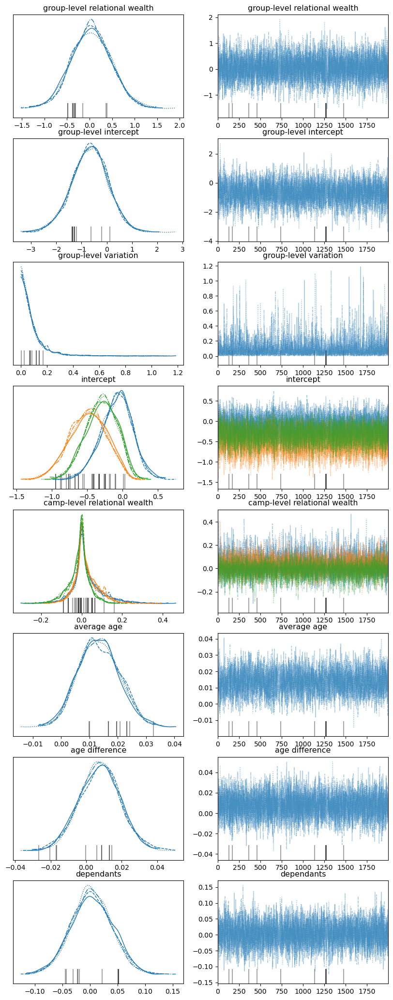

In [73]:
var_names=['group-level relational wealth','group-level intercept','group-level variation',"intercept",'camp-level relational wealth','average age','age difference','dependants']

az.plot_trace(t1_mm,var_names=var_names,figsize=(10,26));

Sampling: [y]


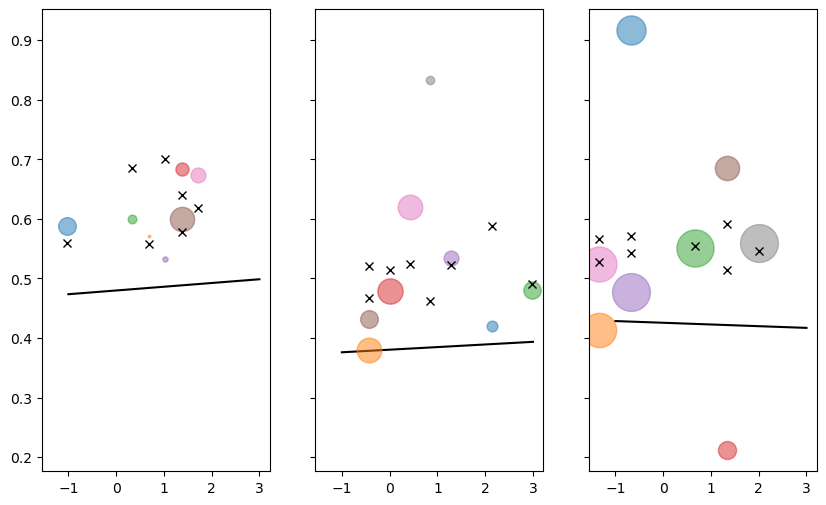

In [80]:
post_pred_bayaka = pm.sample_posterior_predictive(t1_mm,model=m1_bayaka_multimulti)

f, ax = plt.subplots(1,3,sharex=True,sharey=True)

pred_samples = post_pred_bayaka.posterior_predictive['y'].values.reshape((8000,23))
pred_k = pred_samples.mean(axis=0)

a = t1_mm.posterior['intercept'].mean(('chain','draw')).values
b = t1_mm.posterior['camp-level relational wealth'].mean(('chain','draw')).values

x = np.linspace(-1,3)

for i in range(3):
    
    y = np.exp(a[i] + b[i]*x) / (1 + np.exp(a[i] + b[i]*x))
    
    ax[i].plot(x,y,color="black")
    
    for j in range(sum(camp==i)):
        ax[i].plot(x1[camp == i][j],k[camp == i][j]/n[camp == i][j],'o',markersize=n[camp==i][j]/4,alpha=0.5)
    ax[i].plot(x1[camp == i],pred_k[camp == i]/n[camp == i],'x',color="black")

# Agta Bayesian Data Analysis

In [13]:
agta_data = import_agta()

agta_average_age = (agta_data.agem.values + agta_data.agefem.values) / 2
agta_age_diffs = agta_data.agem.values - agta_data.agefem.values
agta_data['camp'] = np.array(pd.Categorical(agta_data['camp']).codes,dtype=np.int64)
agta_data['relational_differences'] = agta_data.male_relational - agta_data.female_relational
agta_data['difference_in_z_score'] = agta_data.male_z_relational - agta_data.female_z_relational
agta_data

,id,agem,agefem,camp,leisurem_counts,leisuref_counts,leisureratio_count,children,male_relational,female_relational,budget,male_z_relational,female_z_relational,relational_differences,difference_in_z_score
53,[A84605],29.016356,18.938820,0,7,11,0.388889,1,0.375000,0.714286,18,-1.591579,1.104981,-0.339286,-2.696560
1,[A54433],35.239013,26.079014,0,10,9,0.526316,3,0.375000,0.666667,19,-1.591579,0.726517,-0.291667,-2.318095
51,[A84603],24.441839,18.134339,0,9,4,0.692308,1,0.666667,0.750000,13,0.726517,1.388830,-0.083333,-0.662313
50,[A84595],35.000000,26.634579,0,6,12,0.333333,4,0.555556,0.428571,18,-0.156567,-1.165806,0.126984,1.009239
49,[A84592],24.851313,18.780000,0,5,13,0.277778,1,0.444444,0.571429,18,-1.039651,-0.030412,-0.126984,-1.009239
48,[A84586],42.845203,41.774581,0,5,5,0.500000,4,0.500000,0.666667,10,-0.598109,0.726517,-0.166667,-1.324626
52,[A84600],62.170305,56.628730,0,17,17,0.500000,1,0.714286,0.625000,34,1.104981,0.395360,0.089286,0.709621
18,[A67094],47.918799,48.671077,1,9,14,0.391304,1,0.083333,0.333333,23,-1.289954,-0.312946,-0.250000,-0.977008
16,[A66024],27.571795,25.450000,1,27,26,0.509434,3,0.000000,0.714286,53,-1.615623,1.175828,-0.714286,-2.791451
15,[A66016],44.835551,35.426478,1,18,13,0.580645,4,0.200000,0.300000,31,-0.834017,-0.443214,-0.100000,-0.390803


In [9]:
agta_data.difference_in_z_score.values.mean(), agta_data.difference_in_z_score.values.std() 

np.mean(agta_data.leisurem_counts.values / agta_data.budget.values), np.std(agta_data.leisurem_counts.values / agta_data.budget.values)

In [15]:
x = agta_data.male_z_relational.values
y = agta_data.female_z_relational.values

np.corrcoef(x,y)

array([[1.        , 0.03577594],
       [0.03577594, 1.        ]])

In [9]:
x = agta_data.male_z_relational.values
y = agta_data.female_z_relational.values

stats.pearsonr(x,y)

PearsonRResult(statistic=0.035775940606355944, pvalue=0.7973107314527745)

-124.20000228107759


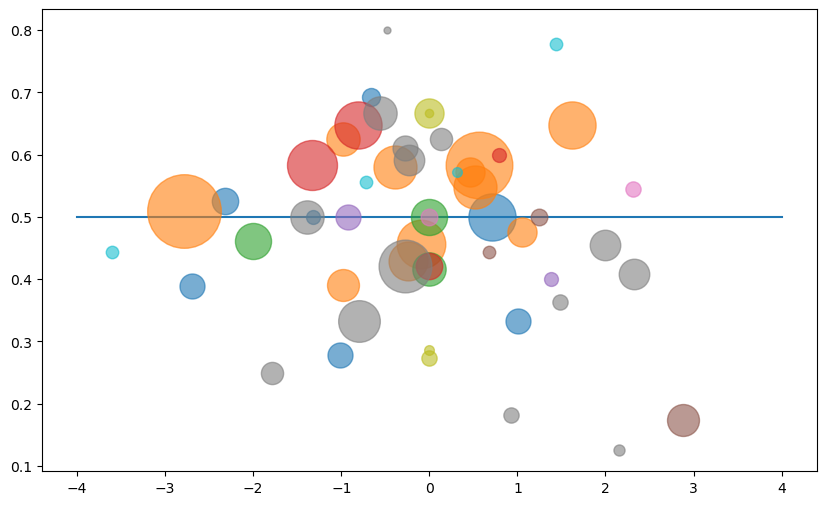

In [65]:
import matplotlib.colors as plc

a = 0
b = 0


k = agta_data.leisurem_counts.values
n = agta_data.budget.values
x = agta_data.difference_in_z_score.values
camp = agta_data.camp.values

inequality = k / n

p = np.exp(a + b*x) / (1 + np.exp(a + b*x))
loglike = stats.binom(p=p,n=n).logpmf(k)
loglike = np.sum(loglike)

print(loglike)

x_plot = np.linspace(-4,4,100)
p_plot = np.exp(a + b*x_plot) / (1 + np.exp(a + b*x_plot))

plt.plot(x_plot,p_plot)

camp_color = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple',
              'tab:brown','tab:pink','tab:gray','tab:olive','tab:cyan']

for i in range(len(k)):

    plt.plot(x[i],inequality[i],'o',markersize=n[i],color=camp_color[camp[i]],alpha=0.6)

## Prior modeling

In [17]:
k = agta_data.leisurem_counts.values
n = agta_data.budget.values
x1 = agta_data.difference_in_z_score.values
x2 = agta_average_age
x3 = agta_age_diffs
camp = agta_data.camp.values

with pm.Model() as m2_agta:
    
    # hyper prior
    hb1mu = pm.Normal('group-level relational wealth',0,0.5)
    hb1std = pm.Exponential('group-level variation',1)
    
    # intercept
    a = pm.Normal('intercept',0,2)
    
    # slope
    bz = pm.Normal('bz',hb1mu,1,shape=10)
    b1 = pm.Deterministic('camp-level relational wealth',hb1std*bz)
    b2 = pm.Normal('average age',0,0.005)
    b3 = pm.Normal('age difference',0,0.03)
    
    # regression equation
    p = pm.invlogit(a + b1[camp]*x1 + b2*x2 + b3*x3)
    p = pm.Deterministic('p',p)
    
    # outcome distribution
    y = pm.Binomial('y',p=p,n=n,observed=k)

In [23]:
k = agta_data.leisurem_counts.values
n = agta_data.budget.values
x1 = agta_data.difference_in_z_score.values
x2 = agta_average_age
x3 = agta_age_diffs
camp = agta_data.camp.values

with pm.Model() as m2_agta_2:
    
    # hyper prior
    hb1mu = pm.Normal('group-level relational wealth',0,0.5)
    hb1std = pm.Exponential('group-level variation',1)
    
    # intercept
    a = pm.Normal('intercept',0,2)
    
    # slope
    bz = pm.Normal('bz',hb1mu,1,shape=10)
    b1 = pm.Deterministic('camp-level relational wealth',hb1std*bz)
    b2 = pm.Normal('average age',0,0.015)
    b3 = pm.Normal('age difference',0,0.03)
    
    # regression equation
    p = pm.invlogit(a + b1[camp]*x1 + b2*x2 + b3*x3)
    p = pm.Deterministic('p',p)
    
    # outcome distribution
    y = pm.Binomial('y',p=p,n=n,observed=k)

### Relational wealth prior predictions

(0.0, 1.0)

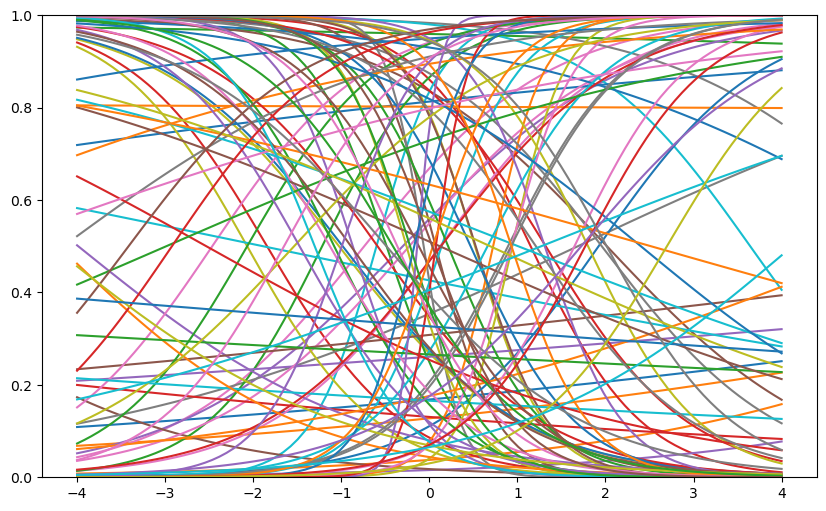

In [27]:
x = np.linspace(-4,4,100)

for i in range(100):
    
    a = stats.norm(0,2).rvs()
    mu = stats.norm(0,1).rvs()
    std = stats.expon(loc=0,scale=1).rvs()
    b = stats.norm(mu,std).rvs()
    y = np.exp(a + b * x) / (1 + np.exp(a + b * x))

    plt.plot(x,y)
plt.ylim([0,1])

### Camp effect prior prediction

Sampling: [age difference, average age, bz, group-level relational wealth, group-level variation, intercept, y]


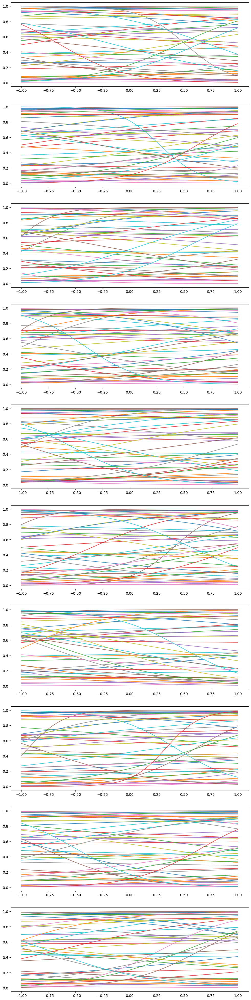

In [28]:
num_samples = 50

with m2_agta:
    pp2 = pm.sample_prior_predictive(num_samples)

x = np.linspace(-1,1,100)

f,ax = plt.subplots(10,figsize=(12,50))

for i in range(num_samples):
    
    for j in range(10):

        a = pp2.prior['intercept'][0][i].values
        b = pp2.prior['camp-level relational wealth'][0][i,j].values

        y = np.exp(a + b * x) / (1 + np.exp(a + b * x))

        ax[j].plot(x,y,alpha=0.8)

### Composite predictions

Sampling: [age difference, average age, bz, group-level relational wealth, group-level variation, intercept, y]


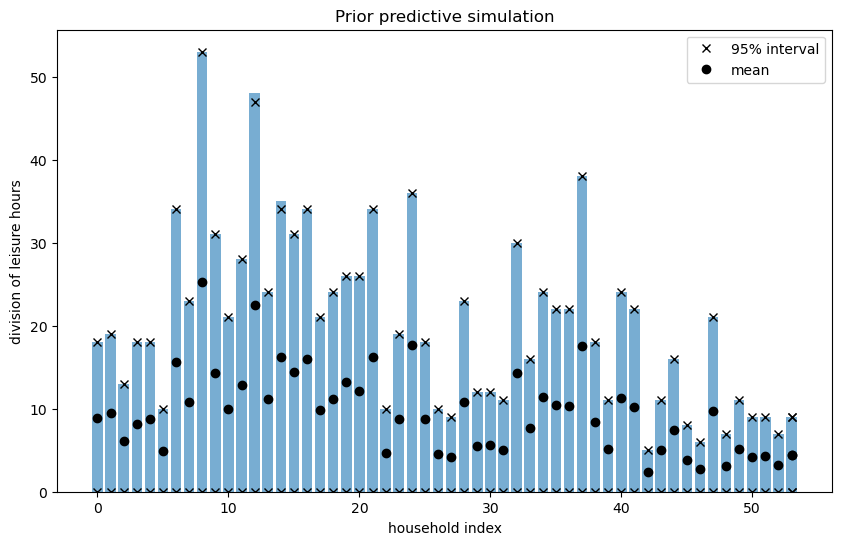

In [46]:
num_samples = 500
pop_size = len(agta_data)

with m2_agta:
    pp2 = pm.sample_prior_predictive(num_samples)
    
x = np.arange(pop_size)

plt.bar(x,n,alpha=0.6)

for i in range(pop_size):
    top = np.percentile(pp2.prior_predictive['y'][0][:,i],97.5)
    bottom = np.percentile(pp2.prior_predictive['y'][0][:,i],2.5)
    mean = pp2.prior_predictive['y'][0][:,i].mean().values
    plt.plot(i,top,'x',color="black")
    plt.plot(i,bottom,'x',color="black")
    plt.plot(i,mean,'o',color="black")
    
plt.plot(i,top,'x',color="black")
plt.plot(i,bottom,'x',color="black",label="95% interval")
plt.plot(i,mean,'o',color="black",label="mean")
    
plt.title('Prior predictive simulation')
plt.xlabel('household index')
plt.ylabel('division of leisure hours')
plt.legend()

### Age effect prior predictions

(0.0, 1.0)

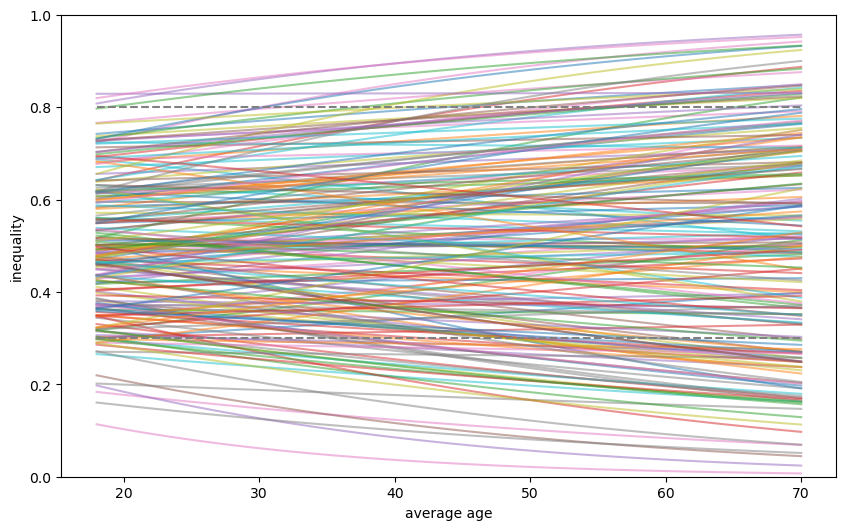

In [22]:
# coefficient scale when x is [18-100]

x = np.linspace(18,70,100)

for i in range(200):

    a = stats.norm(0,0.5).rvs()
    b = stats.norm(0.00,0.015).rvs()

    y = b * x + a
    y = np.exp(y) / (1 + np.exp(y))

    plt.plot(x,y,alpha=0.5)
    
#plt.plot(x,[0.5]*100,'--',color='grey')
plt.plot(x,[0.8]*100,'--',color='grey')
plt.plot(x,[0.3]*100,'--',color='grey')
plt.ylabel('inequality')
plt.xlabel('average age')
plt.ylim([0,1])

(0.0, 1.0)

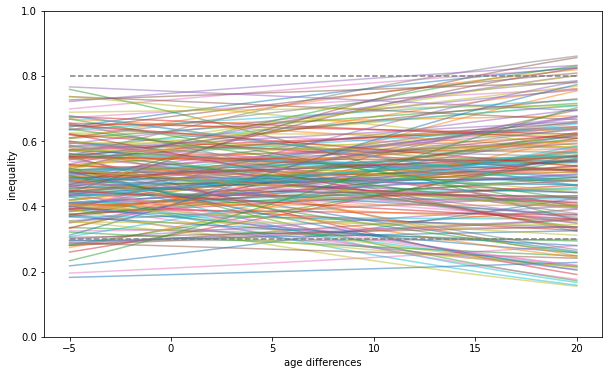

In [80]:
x = np.linspace(-5,20,100)

for i in range(200):

    a = stats.norm(0,0.5).rvs()
    b = stats.norm(0.0,0.03).rvs()

    y = b * x + a
    y = np.exp(y) / (1 + np.exp(y))

    plt.plot(x,y,alpha=0.5)
    
#plt.plot(x,[0.5]*100,'--',color='grey')
plt.plot(x,[0.8]*100,'--',color='grey')
plt.plot(x,[0.3]*100,'--',color='grey')
plt.ylabel('inequality')
plt.xlabel('age differences')
plt.ylim([0,1])

## Sampling

In [30]:
rs = RandomState(MT19937(SeedSequence(123456789)))

with m2_agta:
    t2 = pm.sample(tune=2000,draws=2000,chains=4,target_accept=0.9,random_seed=rs)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group-level relational wealth, group-level variation, intercept, bz, average age, age difference]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 34 seconds.


In [24]:
rs = RandomState(MT19937(SeedSequence(123456789)))

with m2_agta_2:
    t2_2 = pm.sample(tune=2000,chains=4,target_accept=0.9,random_seed=rs)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group-level relational wealth, group-level variation, intercept, bz, average age, age difference]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 63 seconds.


In [31]:
t2.to_json('trace_agta')

'trace_agta'

In [14]:
t2 = az.from_json('trace_agta')

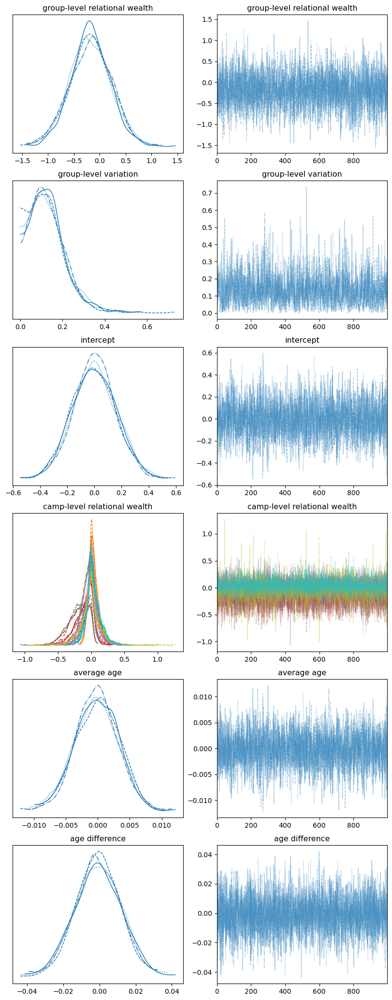

In [66]:
var_names=['group-level relational wealth','group-level variation',"intercept",'camp-level relational wealth','average age','age difference']

az.plot_trace(t2,var_names=var_names,figsize=(10,26));

In [45]:
var_names=['group-level relational wealth','group-level variation',"intercept",'camp-level relational wealth','average age','age difference']

az.summary(t2,var_names=var_names,hdi_prob=0.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
group-level relational wealth,-0.182,0.399,-0.960,0.602,0.008,0.006,2499.0,2815.0,1.0
group-level variation,0.131,0.086,0.000,0.287,0.003,0.002,1060.0,1346.0,1.0
intercept,-0.000,0.161,-0.322,0.306,0.003,0.003,2910.0,2814.0,1.0
camp-level relational wealth[0],0.012,0.085,-0.168,0.185,0.001,0.001,5240.0,3900.0,1.0
camp-level relational wealth[1],0.029,0.067,-0.095,0.168,0.001,0.001,4534.0,3833.0,1.0
camp-level relational wealth[2],0.007,0.114,-0.237,0.235,0.002,0.002,4952.0,3644.0,1.0
camp-level relational wealth[3],-0.099,0.139,-0.415,0.125,0.003,0.002,2940.0,3411.0,1.0
camp-level relational wealth[4],-0.043,0.135,-0.324,0.225,0.002,0.002,4442.0,3473.0,1.0
camp-level relational wealth[5],-0.188,0.150,-0.491,0.033,0.004,0.003,1481.0,2272.0,1.0
camp-level relational wealth[6],-0.001,0.124,-0.247,0.267,0.002,0.002,4909.0,3113.0,1.0


In [26]:
t2_2

var_names=['group-level relational wealth','group-level variation',"intercept",'camp-level relational wealth','average age','age difference']

az.summary(t2_2,var_names=var_names,hdi_prob=0.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
group-level relational wealth,-0.180,0.414,-0.990,0.639,0.009,0.008,2041.0,1950.0,1.0
group-level variation,0.127,0.083,0.000,0.279,0.002,0.002,1147.0,1177.0,1.0
intercept,0.005,0.189,-0.375,0.364,0.004,0.003,2566.0,2782.0,1.0
camp-level relational wealth[0],0.013,0.083,-0.141,0.199,0.001,0.001,4611.0,3080.0,1.0
camp-level relational wealth[1],0.027,0.068,-0.095,0.175,0.001,0.001,4837.0,3683.0,1.0
camp-level relational wealth[2],0.008,0.109,-0.208,0.243,0.001,0.002,5353.0,3451.0,1.0
camp-level relational wealth[3],-0.099,0.133,-0.384,0.123,0.003,0.002,2578.0,3060.0,1.0
camp-level relational wealth[4],-0.038,0.136,-0.313,0.250,0.002,0.002,4613.0,3288.0,1.0
camp-level relational wealth[5],-0.186,0.151,-0.481,0.038,0.004,0.003,1465.0,2023.0,1.0
camp-level relational wealth[6],0.002,0.124,-0.263,0.251,0.002,0.002,4286.0,3185.0,1.0


## Results

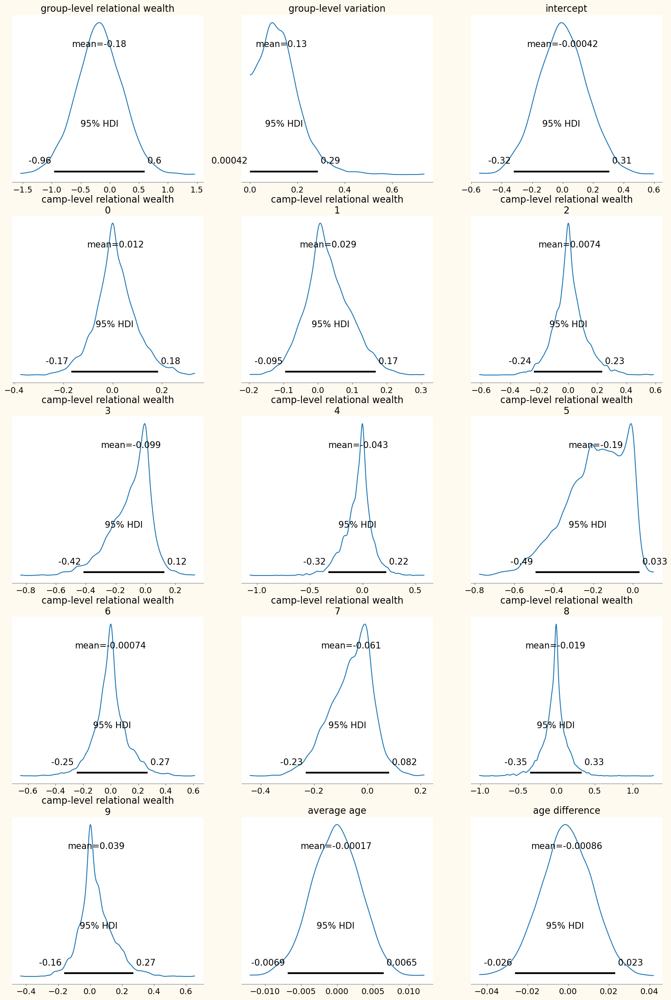

In [48]:
var_names=['group-level relational wealth','group-level variation',"intercept",'camp-level relational wealth','average age','age difference']

az.plot_posterior(t2,var_names=var_names,hdi_prob=0.95,figsize=(20,30),backend_kwargs={'facecolor':"floralwhite"});

## Posterior Checks

### Composite effect

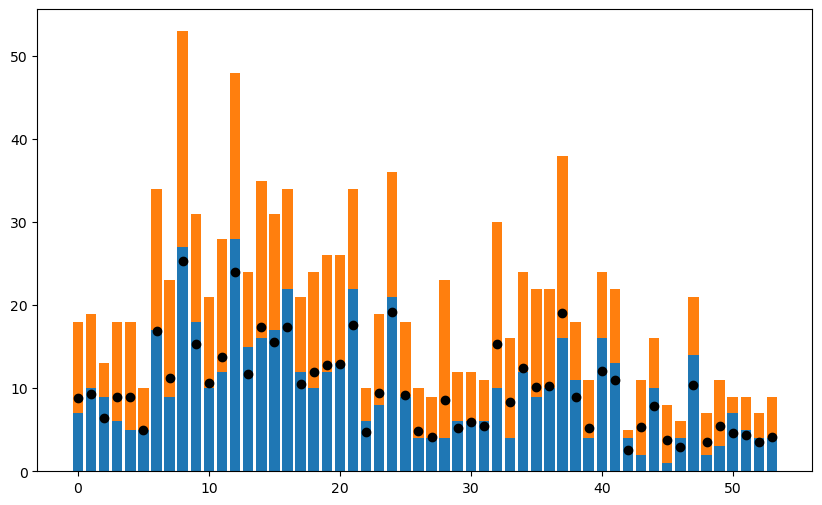

In [71]:
p = t2.posterior['p'].mean(('chain','draw'))
n = agta_data.budget.values
y = n * p
k = agta_data.leisurem_counts.values
x = np.arange(len(agta_data))
plt.bar(x,k)
plt.bar(x,n-k,bottom=k)
plt.plot(x,y,'o',color="black")

Sampling: [y]


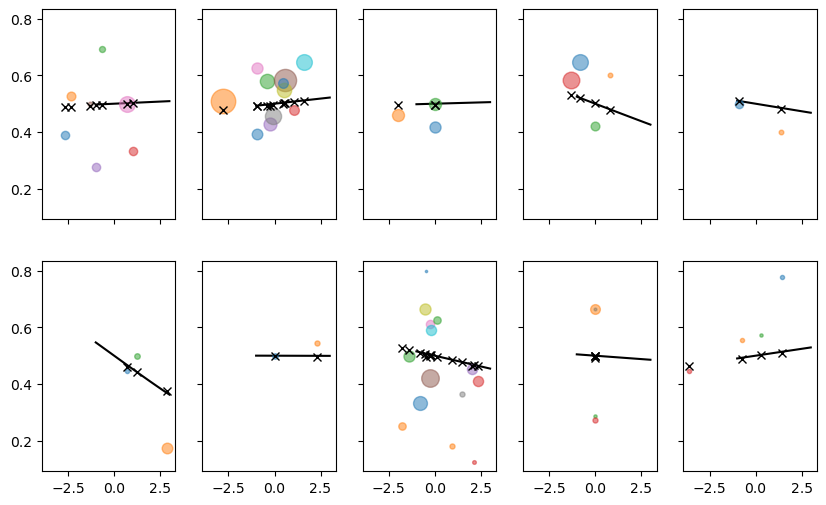

In [17]:
post_pred_agta = pm.sample_posterior_predictive(t2,model=m2_agta)

f, ax = plt.subplots(2,5,sharex=True,sharey=True)

pred_samples = post_pred_agta.posterior_predictive['y'].values.reshape((4000,54))
pred_k = pred_samples.mean(axis=0)

a = t2.posterior['intercept'].mean(('chain','draw')).values
b = t2.posterior['camp-level relational wealth'].mean(('chain','draw')).values

x = np.linspace(-1,3)

for i in range(5):
    
    y = np.exp(a + b[i]*x) / (1 + np.exp(a + b[i]*x))
    
    ax[0][i].plot(x,y,color="black")
    
    for j in range(sum(camp==i)):
        ax[0][i].plot(x1[camp == i][j],k[camp == i][j]/n[camp == i][j],'o',markersize=n[camp==i][j]/3,alpha=0.5)
        
    ax[0][i].plot(x1[camp == i],pred_k[camp == i]/n[camp == i],'x',color="black")
    
for i in range(5,10):
    
    y = np.exp(a + b[i]*x) / (1 + np.exp(a + b[i]*x))
    
    ax[1][i-5].plot(x,y,color="black")
    
    for j in range(sum(camp==i)):
        ax[1][i-5].plot(x1[camp == i][j],k[camp == i][j]/n[camp == i][j],'o',markersize=n[camp==i][j]/3,alpha=0.5)
        
    ax[1][i-5].plot(x1[camp == i],pred_k[camp == i]/n[camp == i],'x',color="black")

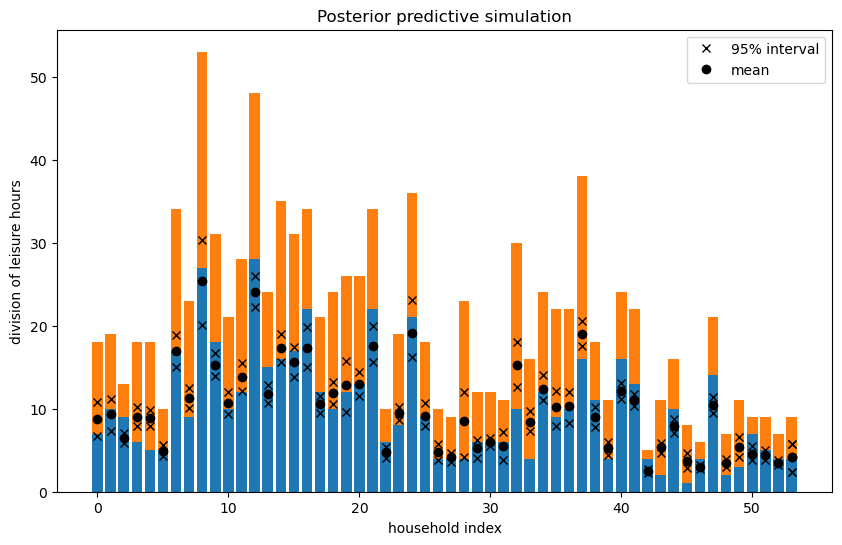

In [52]:
x = np.arange(len(agta_data))
n = agta_data.budget.values
k = agta_data.leisurem_counts.values

plt.bar(x,k)
plt.bar(x,n-k,bottom=k)

for i in range(len(agta_data)):
    top = n[i]* np.percentile(t2.posterior['p'][:,:,i],97.5)
    bottom = n[i]*np.percentile(t2.posterior['p'][:,:,i],2.5)
    mean = n[i]*t2.posterior['p'][:,:,i].mean().values
    plt.plot(i,top,'x',color="black")
    plt.plot(i,bottom,'x',color="black")
    plt.plot(i,mean,'o',color="black")
    
plt.plot(i,top,'x',color="black")
plt.plot(i,bottom,'x',color="black",label="95% interval")
plt.plot(i,mean,'o',color="black",label="mean")
    
plt.title('Posterior predictive simulation')
plt.xlabel('household index')
plt.ylabel('division of leisure hours')
plt.legend()

(0.0, 1.0)

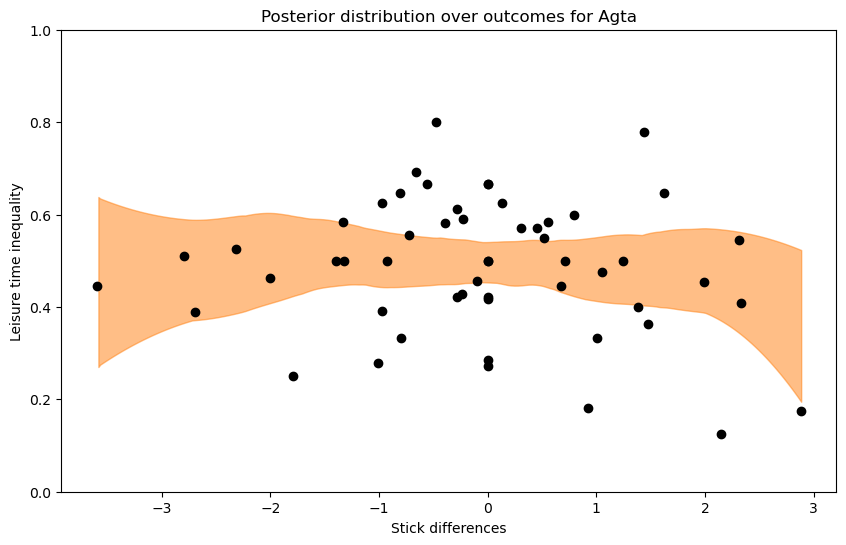

In [41]:
x = agta_data.difference_in_z_score.values
n = agta_data.budget.values
k = agta_data.leisurem_counts.values

az.plot_hdi(x,t2.posterior['p'],hdi_prob=0.95)
plt.plot(x,k/n,'o',color='black',label='observed')
plt.title('Posterior distribution over outcomes for Agta')
plt.xlabel('Stick differences')
plt.ylabel('Leisure time inequality')
plt.ylim([0,1])

### Relational wealth group-level effect

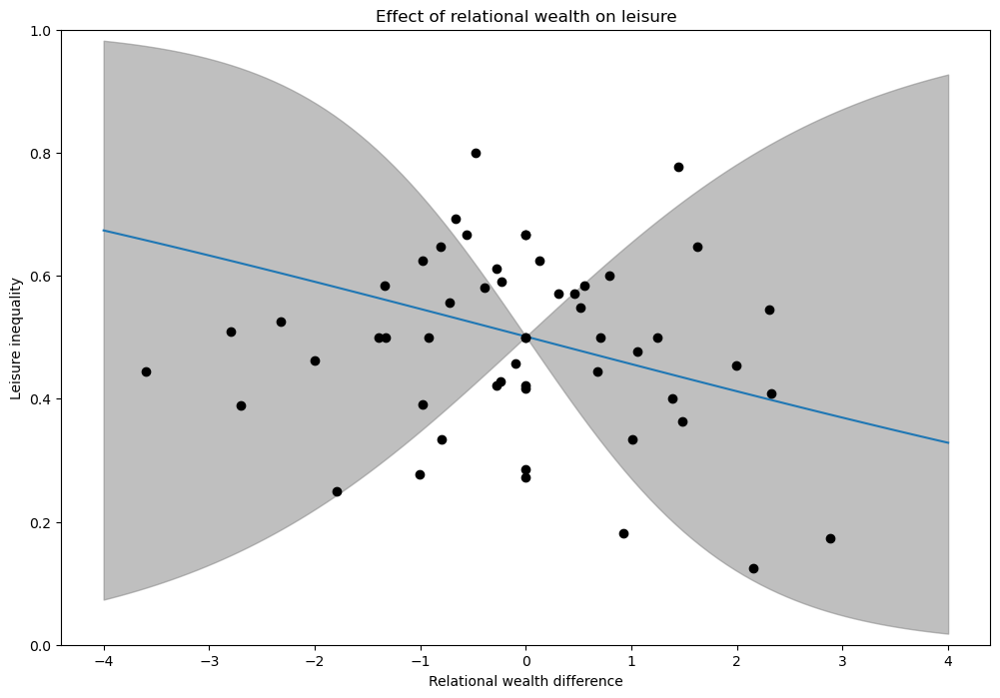

In [25]:
t2 = t2_2

x = np.linspace(-4,4,100)

k = agta_data.leisurem_counts.values
n = agta_data.budget.values

a = t2.posterior['intercept'].mean(('chain','draw')).values
b = t2.posterior['group-level relational wealth'].mean(('chain','draw')).values
b1 = np.percentile(t2.posterior['group-level relational wealth'],97.5)
b2 = np.percentile(t2.posterior['group-level relational wealth'],2.5)

y = np.exp(a + b*x) / (1 + np.exp(a + b*x))
y1 = np.exp(a + b1*x) / (1 + np.exp(a + b1*x))
y2 = np.exp(a + b2*x) / (1 + np.exp(a + b2*x))

plt.figure(figsize=(12,8))

plt.plot(x,y)
plt.fill_between(x,y1,y2,color="grey",alpha=0.5)
plt.plot(agta_data.difference_in_z_score.values,k/n,'o',color='black',label='observed')
plt.ylim([0,1])
plt.xlabel("Relational wealth difference")
plt.ylabel("Leisure inequality")
plt.title("Effect of relational wealth on leisure");

C:\Users\dsaun\AppData\Local\Temp\ipykernel_8900\3638935755.py:19: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdis = az.hdi(ys)


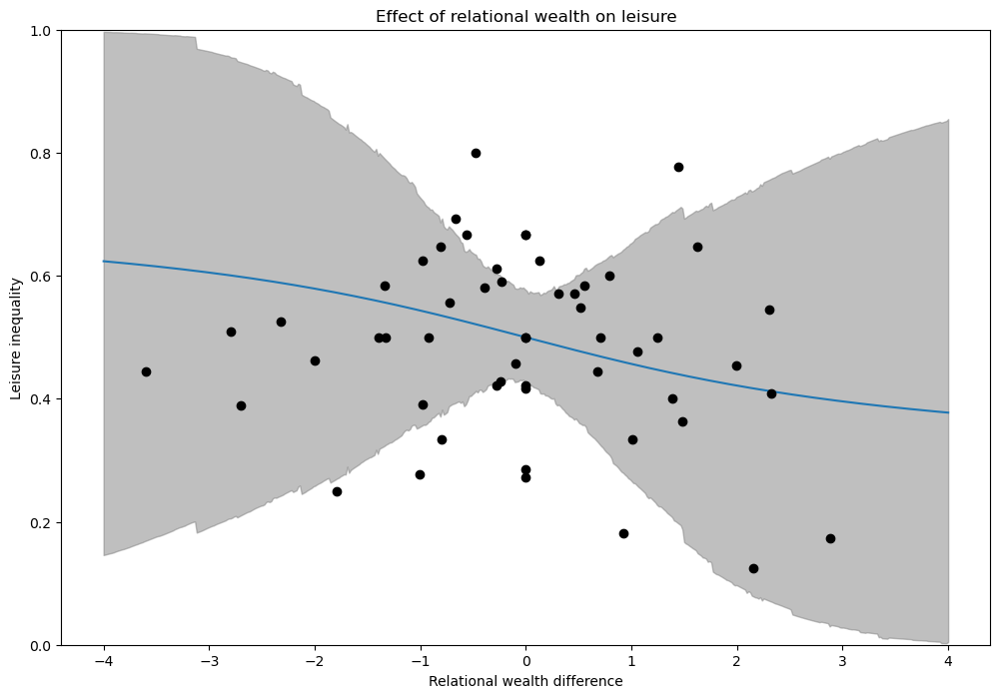

In [18]:
x = np.linspace(-4,4,500)

k = agta_data.leisurem_counts.values
n = agta_data.budget.values

intercepts = t2.posterior['intercept'].values.flatten()
slopes = t2.posterior['group-level relational wealth'].values.flatten()

ys = []

for i in range(4000):

    a = intercepts[i]
    b = slopes[i]
    y = np.exp(a + b*x) / (1 + np.exp(a + b*x))
    ys.append(y)
    
ys = np.array(ys)
hdis = az.hdi(ys)
y = ys.mean(axis=0) 
y1 = hdis[:,0]
y2 = hdis[:,1]

plt.figure(figsize=(12,8))

plt.plot(x,y)
plt.fill_between(x,y1,y2,color="grey",alpha=0.5)
plt.plot(agta_data.difference_in_z_score.values,k/n,'o',color='black',label='observed')
plt.ylim([0,1])
plt.xlabel("Relational wealth difference")
plt.ylabel("Leisure inequality")
plt.title("Effect of relational wealth on leisure");

### Age effects

(0.0, 1.0)

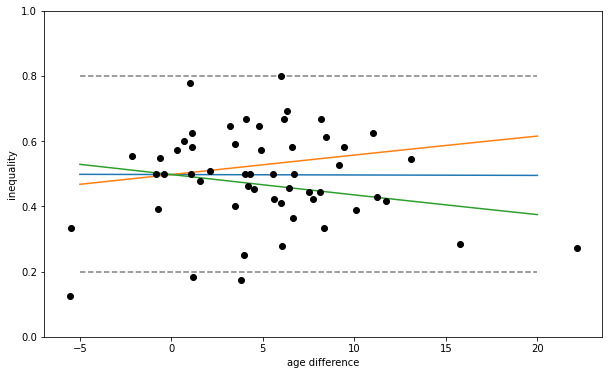

In [411]:
# coefficient scale when x = [-5,20]

x = np.linspace(-5,20,100)
a = t2.posterior['intercept'].mean(('chain','draw')).values
b = t2.posterior['age difference'].mean(('chain','draw')).values
b1 = np.percentile(t2.posterior['age difference'],97.5)
b2 = np.percentile(t2.posterior['age difference'],2.5)

y = b * x + a
y = np.exp(y) / (1 + np.exp(y))
y1 = b1 * x + a
y1 = np.exp(y1) / (1 + np.exp(y1))
y2 = b2 * x + a
y2 = np.exp(y2) / (1 + np.exp(y2))

plt.plot(x,y)
plt.plot(x,y1)
plt.plot(x,y2)
plt.ylabel('inequality')
plt.xlabel('age difference')
plt.plot(x,[0.8]*100,'--',color='grey')
plt.plot(x,[0.2]*100,'--',color='grey')
plt.plot(agta_age_diffs,k/n,'o',color='black',label='observed')
plt.ylim([0,1])

(0.0, 1.0)

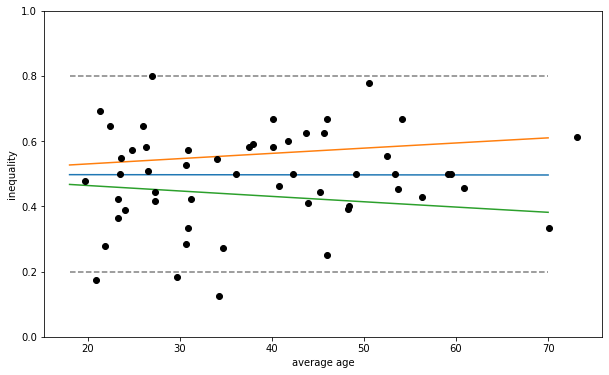

In [412]:
# coefficient scale when x is [18-100]

a = t2.posterior['intercept'].mean(('chain','draw')).values
b = t2.posterior['average age'].mean(('chain','draw')).values
b1 = np.percentile(t2.posterior['average age'],97.5)
b2 = np.percentile(t2.posterior['average age'],2.5)

x = np.linspace(18,70,100)
y = b * x + a
y = np.exp(y) / (1 + np.exp(y))
y1 = b1 * x + a
y1 = np.exp(y1) / (1 + np.exp(y1))
y2 = b2 * x + a
y2 = np.exp(y2) / (1 + np.exp(y2))

plt.plot(x,y)
plt.plot(x,y1)
plt.plot(x,y2)
#plt.plot(x,[0.5]*100,'--',color='grey')
plt.plot(x,[0.8]*100,'--',color='grey')
plt.plot(x,[0.2]*100,'--',color='grey')
plt.ylabel('inequality')
plt.xlabel('average age')
plt.plot(agta_average_age,k/n,'o',color='black',label='observed')
plt.ylim([0,1])